**Import Library**

In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import time
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

**Crop Dataset**

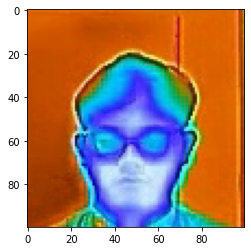

In [5]:
# Contoh 1 image
vidcap = cv2.VideoCapture('dataset/P/puas_resp6_kondisi4.mp4') # filename
vidcap.set(cv2.CAP_PROP_POS_FRAMES, 150) #mengambil frame ke 200
success,image = vidcap.read() # convert video to image
plt.imshow(image[60:160, 110:210]); # crop image to square (atas, bawah, kiri, kanan)
# [60:160, 100:200]

**Membuat Dataset**

In [10]:
for i in os.listdir('dataset/'): # akses folder data
    if not i.endswith('.DS_Store') and not i.endswith('.ipynb_checkpoints'): # hanya mengambil folder
        folder = 'dataset/'+i # nama folder contoh: data/puas
        for j in os.listdir(folder): # akses file dalam folder
            if j.endswith('mp4'): # akses file jika hanya berkahiran '.mp4'
                rs1 = j.split('_')[1] # mendapatkan namanya
                rs2 = j.split('_')[2] # mendapatkan namanya
                vidcap = cv2.VideoCapture(folder+'/'+j) # membaca file video
                for k in range(300):
                    vidcap.set(cv2.CAP_PROP_POS_FRAMES, k)
                    success,image = vidcap.read()
                    try:
                        os.makedirs(folder+'/frames', exist_ok=True)
                        cv2.imwrite(folder+'/frames/'+rs1+rs2+"_frame"+str(k)+".jpg", image[60:160, 110:210]) 
                    except:
                        pass
                vidcap.release()

**Merubah Image ke dataframe**

In [4]:
label = []
filename = []

pd.options.display.max_columns = 100
# Set the maximum number of rows to display
pd.options.display.max_rows = 4000

# Set the display width to 100 characters
pd.options.display.width = 100

# Set the precision of floating-point numbers to 4 decimal places
pd.options.display.precision = 4

# access the dataset folder
for i in os.listdir('dataset/'): # access folder data
    if not i.endswith('.DS_Store') and not i.endswith('.ipynb_checkpoints'): # only take folders
        folder = 'dataset/'+i+'/frames'
        frames = os.listdir(folder)
        random_frames = random.sample(frames, 900)
        for frame in random_frames:
            if frame.endswith('jpg'):
                label.append(i)                
                filename.append(folder+'/'+frame)
# create a dataframe from the labels and filenames
df = pd.DataFrame(data=np.transpose([label, filename]), columns=['label', 'name'])
df

,label,name
0,P,dataset/P/frames/resp9kondisi3.mp4_frame260.jpg
1,P,dataset/P/frames/resp7kondisi4.mp4_frame189.jpg
2,P,dataset/P/frames/resp9kondisi4.mp4_frame206.jpg
3,P,dataset/P/frames/resp3kondisi3.mp4_frame155.jpg
4,P,dataset/P/frames/resp9kondisi4.mp4_frame134.jpg
5,P,dataset/P/frames/resp10kondisi3.mp4_frame75.jpg
6,P,dataset/P/frames/resp7kondisi4.mp4_frame108.jpg
7,P,dataset/P/frames/resp3kondisi4.mp4_frame99.jpg
8,P,dataset/P/frames/resp3kondisi3.mp4_frame62.jpg
9,P,dataset/P/frames/resp3kondisi3.mp4_frame119.jpg


**Save dataframe to csv**

In [38]:
df.to_csv('selected_frames_1.csv', index=False)

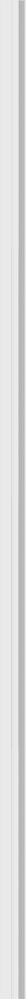

In [39]:
fig = plt.figure(figsize =(20, 10))
ax = fig.add_subplot(111)
ax.axis('tight')
ax.axis('off')
the_table = ax.table(cellText=df.values, colLabels=df.columns, loc='center')
plt.show()

##### Ekstraksi fitur dengan GLCM

In [5]:
# ----------------- calculate greycomatrix() & greycoprops() for angle 0, 45, 90, 135 ----------------------------------
def calc_glcm_all_agls(img, label, props, dists=[5], agls=[0, np.pi/4, np.pi/2, 3*np.pi/4], lvl=256, sym=True, norm=True):
    img = cv2.imread(img) 
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    ymin, ymax, xmin, xmax = h//3, h*2//3, w//3, w*2//3
    img = gray[ymin:ymax, xmin:xmax]
    glcm = graycomatrix(img, 
                        distances=dists, 
                        angles=agls, 
                        levels=lvl,
                        symmetric=sym, 
                        normed=norm)
    feature = []
    glcm_props = [propery for name in props for propery in graycoprops(glcm, name)[0]]
    for item in glcm_props:
            feature.append(item)
    feature.append(label) 
    return feature


# ----------------- call calc_glcm_all_agls() for all properties ----------------------------------
properties = ['dissimilarity', 'correlation', 'homogeneity', 'contrast', 'energy']

In [6]:
glcm_all_agls = []
for i,j in df.groupby(['name', 'label']):
    glcm_all_agls.append(calc_glcm_all_agls(i[0], i[1], props=properties))
columns = []
angles = ['0', '45', '90','135']
for name in properties :
    for ang in angles:
        columns.append(name + "_" + ang)
        
columns.append("label")
glcm_df = pd.DataFrame(glcm_all_agls, 
                      columns = columns)

**Save Extraction GLCM to CSV**

In [42]:
glcm_df.to_csv('hasil_ekstraksi_fitur_glcm.csv', index=False)

In [43]:
glcm_df.describe()

,dissimilarity_0,dissimilarity_45,dissimilarity_90,dissimilarity_135,correlation_0,correlation_45,correlation_90,correlation_135,homogeneity_0,homogeneity_45,homogeneity_90,homogeneity_135,contrast_0,contrast_45,contrast_90,contrast_135,energy_0,energy_45,energy_90,energy_135
count,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000,3600.0000
mean,30.6931,35.9395,34.9743,33.5488,0.4706,0.3086,0.3678,0.3798,0.0541,0.0427,0.0426,0.0444,1821.8304,2344.9156,2272.9597,2113.6421,0.0273,0.0279,0.0269,0.0280
std,8.6842,10.5145,13.6512,11.2311,0.1447,0.1764,0.3003,0.2307,0.0221,0.0210,0.0214,0.0176,905.4089,1071.6622,1413.7988,1183.3788,0.0029,0.0028,0.0029,0.0027
min,11.6526,14.9061,10.6732,15.0309,0.0362,-0.1636,-0.2636,-0.1080,0.0151,0.0118,0.0089,0.0113,272.3106,404.7883,213.7143,368.6932,0.0239,0.0249,0.0238,0.0247
25%,24.0225,28.7681,22.7744,23.1225,0.3722,0.1945,0.1340,0.1873,0.0351,0.0251,0.0245,0.0305,1135.8742,1563.4649,963.3117,1033.8838,0.0250,0.0257,0.0247,0.0258
50%,28.3766,36.1950,34.8891,32.2604,0.4900,0.2983,0.2902,0.3663,0.0518,0.0389,0.0377,0.0433,1547.4172,2239.6052,2003.7603,1788.4221,0.0265,0.0270,0.0259,0.0271
75%,37.9310,44.7765,46.8812,44.6468,0.5695,0.4360,0.6389,0.5865,0.0674,0.0536,0.0585,0.0570,2464.2367,3162.2238,3397.7008,3233.6466,0.0284,0.0291,0.0283,0.0292
max,52.1255,59.9762,68.9805,58.0595,0.8718,0.7374,0.9031,0.8113,0.1547,0.1432,0.1470,0.1190,4550.3766,5401.0904,6743.5606,5537.5517,0.0533,0.0598,0.0572,0.0531


##### Train test split

In [7]:
X = glcm_df.drop(columns=['label'])
y = glcm_df.label

X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, random_state=42)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape

((2880, 20), (360, 20), (360, 20), (2880,), (360,), (360,))

In [8]:
X_test

,dissimilarity_0,dissimilarity_45,dissimilarity_90,dissimilarity_135,correlation_0,correlation_45,correlation_90,correlation_135,homogeneity_0,homogeneity_45,homogeneity_90,homogeneity_135,contrast_0,contrast_45,contrast_90,contrast_135,energy_0,energy_45,energy_90,energy_135
2240,40.5097,45.9394,47.2987,46.0404,0.3409,0.2391,0.1838,0.2087,0.0401,0.0199,0.0245,0.0245,2921.1656,3351.6873,3470.4437,3383.9952,0.0243,0.0255,0.0244,0.0258
2077,19.5444,18.1974,12.8701,19.7265,0.5684,0.6327,0.8810,0.6243,0.0990,0.0783,0.0629,0.0550,836.5942,716.4661,271.3117,735.4031,0.0299,0.0298,0.0291,0.0294
2211,41.3723,44.6932,45.7251,46.9394,0.3532,0.2872,0.2413,0.2266,0.0297,0.0227,0.0192,0.0222,2866.6212,3209.7515,3316.2186,3427.3793,0.0244,0.0254,0.0248,0.0255
2780,24.9242,45.1902,48.8550,43.7444,0.6104,0.1087,-0.0429,0.1327,0.0800,0.0207,0.0178,0.0189,1295.0498,2949.4685,3318.5368,2848.1795,0.0269,0.0262,0.0248,0.0263
430,38.8236,40.8751,46.0617,43.5351,0.3010,0.2511,0.1180,0.1815,0.0580,0.0409,0.0290,0.0376,2699.8431,2857.1106,3249.2392,3132.1962,0.0265,0.0275,0.0251,0.0266
969,33.5011,50.1225,54.4686,51.2723,0.4725,0.0111,-0.1801,-0.0215,0.0401,0.0206,0.0186,0.0226,1920.2695,3747.4637,4313.6136,3875.4816,0.0249,0.0254,0.0245,0.0257
644,32.4578,37.0285,42.6764,35.6576,0.4912,0.3219,0.2018,0.3873,0.0557,0.0510,0.0474,0.0506,2130.4968,2769.1641,3400.8193,2480.3306,0.0271,0.0277,0.0271,0.0273
1044,21.7132,36.0820,38.3994,28.2081,0.7839,0.4683,0.4614,0.6516,0.0965,0.0604,0.0539,0.0632,1169.0574,2667.6231,2741.5227,1645.0761,0.0314,0.0306,0.0297,0.0309
1789,36.9026,39.0059,28.6288,26.0511,0.5356,0.4925,0.7144,0.7560,0.0315,0.0297,0.0419,0.0418,2234.9524,2434.0404,1457.6591,1136.9952,0.0247,0.0255,0.0261,0.0267
781,28.2413,26.4911,22.5390,25.8026,0.3547,0.3821,0.6229,0.4167,0.0382,0.0415,0.0494,0.0358,1253.7630,1218.3746,878.3398,1093.1677,0.0270,0.0281,0.0271,0.0285


##### Scaling data

In [45]:
preprocessor = ColumnTransformer([
    ('numeric', MinMaxScaler(), X.columns)
])

In [46]:
pipeline = Pipeline([
    ('prep', preprocessor),
    ('algo', KNeighborsClassifier())
])

##### Model training

In [47]:
knn_params = {'algo__n_neighbors': np.array([ 5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29]),
              'algo__weights': ['uniform', 'distance'],
              'algo__p': [1, 1.5, 2]}

In [48]:
model = GridSearchCV(pipeline, knn_params, cv=3, n_jobs=-1, verbose=1)
model.fit(X_train, y_train)

print(model.best_params_)
print(model.score(X_train, y_train), model.score(X_val, y_val), model.best_score_, model.score(X_test, y_test))

Fitting 3 folds for each of 78 candidates, totalling 234 fits
{'algo__n_neighbors': 7, 'algo__p': 1.5, 'algo__weights': 'distance'}
1.0 0.9861111111111112 0.9635416666666666 0.9638888888888889


##### Evaluasi dengan confussion matrix

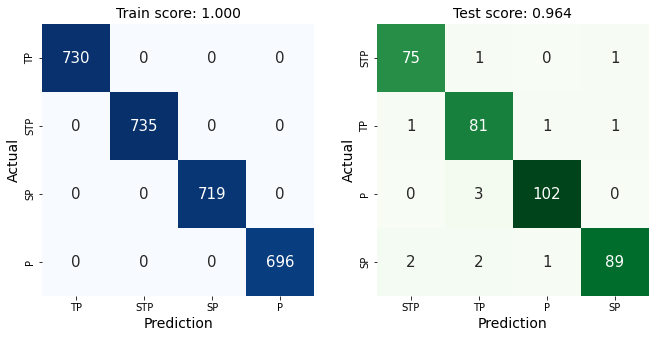

In [49]:
plt.figure(figsize=(11, 5))

plt.subplot(121)
labels = y_train.unique()
cm = confusion_matrix(y_train, model.predict(X_train), labels=labels)
sns.heatmap(cm, annot=True, square=True, cmap='Blues', cbar=False, xticklabels=labels, yticklabels=labels,
            fmt="d", annot_kws={"fontsize": 15})
plt.title(f'Train score: {model.score(X_train, y_train):.3f}', fontsize=14)
plt.xlabel('Prediction', fontsize=14)
plt.ylabel('Actual', fontsize=14)

# plt.subplot(122)
# labels = y_train.unique()
# cm = confusion_matrix(y_val, model.predict(X_val), labels=labels)
# sns.heatmap(cm, annot=True, square=True, cmap='Reds', cbar=False, xticklabels=labels, yticklabels=labels,
#             fmt="d", annot_kws={"fontsize": 15})
# plt.title(f'Validate score: {model.score(X_val, y_val):.3f}', fontsize=14)
# plt.xlabel('Prediction', fontsize=14)
# plt.ylabel('Actual', fontsize=14)

plt.subplot(122)
labels = y_test.unique()
cm = confusion_matrix(y_test, model.predict(X_test), labels=labels)
sns.heatmap(cm, annot=True, square=True, cmap='Greens', cbar=False, xticklabels=labels, yticklabels=labels,
            fmt="d", annot_kws={"fontsize": 15})
plt.title(f'Test score: {model.score(X_test, y_test):.3f}', fontsize=14)
plt.xlabel('Prediction', fontsize=14)
plt.ylabel('Actual', fontsize=14);

### Print Report

In [50]:
print("Train report")
print(classification_report(y_train, model.predict(X_train)))
print()
print("Validate report")
print(classification_report(y_val, model.predict(X_val)))
print()
print("Test report")
print(classification_report(y_test, model.predict(X_test)))

Train report
              precision    recall  f1-score   support

           P       1.00      1.00      1.00       696
          SP       1.00      1.00      1.00       719
         STP       1.00      1.00      1.00       735
          TP       1.00      1.00      1.00       730

    accuracy                           1.00      2880
   macro avg       1.00      1.00      1.00      2880
weighted avg       1.00      1.00      1.00      2880


Validate report
              precision    recall  f1-score   support

           P       0.99      0.99      0.99        99
          SP       1.00      0.95      0.98        87
         STP       0.98      1.00      0.99        88
          TP       0.98      1.00      0.99        86

    accuracy                           0.99       360
   macro avg       0.99      0.99      0.99       360
weighted avg       0.99      0.99      0.99       360


Test report
              precision    recall  f1-score   support

           P       0.98      0.9

##### Contoh prediksi

Pred_proba:  [0. 0. 1. 0.]
pred_a: 100.0%


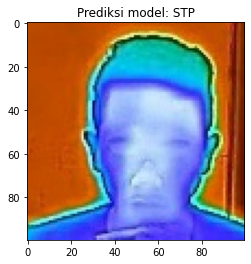

In [51]:
# filename = df.sample()['name'].values[0]
filename = df.sample()['name'].values[0]
val = pd.DataFrame([calc_glcm_all_agls(filename, '1', properties)[:-1]],
                   columns=X.columns)
pred = model.predict(val)[0]
pred_proba = model.predict_proba(val)[0]
a = np.argmax(pred_proba)
plt.imshow(cv2.imread(filename))
plt.title('Prediksi model: '+str(pred))
print('Pred_proba: ',pred_proba )
print('pred_a: '+str(float(pred_proba[a])*100)+'%')

#### Import Model KNN to Joblib

In [52]:
import joblib

# train the KNN model
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# save the model to a file
joblib.dump(knn, 'knn_models.joblib')

['knn_models.joblib']